# **Taller 7: Clasificación - Regresión logística y Bayes Ingenuo**

**Curso: 09481 - Inteligencia Artificial.**

**Universidad Icesi.**

**Profesor: Breyner Posso.**

**Estudiante: Daniela Olarte**

En la primera parte de este taller vamos a explorar la regresión logística y bayes ingenuo para problemas de clasificación binaria. En la segunda parte del taller vamos a explorar un subconjunto de un conjunto de datos para clasificación multiclase conocido como MNIST. Para abordar este problema utilizaremos la estrategia "uno contra todos" (one vs. all) también conocida como "uno contra el resto" (one vs. the rest).

# PARTE 1: Regresión logística para clasificación binaria.

# 0. Importar Librerías.

In [2]:
#Librerías de interés.
import pandas as pd                                   #Importamos la librería pandas. Nos va a servir para leer y manipular conjuntos de datos tabulares.
import matplotlib.pyplot as plt                       #Importamos pyplot de librería matplotlib. Lo vamos a utilizar para graficar.
from matplotlib.colors import LinearSegmentedColormap #Útil para definir un mapa de color por segmentos lineales. 
import numpy as np                                    #Importamos la librería numpy para manipular arreglos. 
import seaborn as sns

#from google.colab import files                        #Esta librería nos sirve para cargar archivos desde el disco duro.

#!pip install sklearn --upgrade                       #En caso que requiera actualizar sklearn. 
from sklearn.model_selection import train_test_split  #Útil para dividir los conjuntos de datos. 
from sklearn.preprocessing import MinMaxScaler        #Útil para escalar los atributos de entrada.
import sklearn.datasets as dt                         #Útil para crear datasets sintéticos para hacer pruebas. 
from sklearn.linear_model import LogisticRegression   #Modelo de regresión logística para clasificación. 
from sklearn import metrics                           #Permite calcular algunas métricas de desempeño.

from copy import deepcopy                             #Permite hacer copias profundas. 

# Función sigmoide o logit.

\begin{equation}
{y_{pred}}\left( {{z^{\left( j \right)}}} \right) = \sigma \left( {{z^{\left( j \right)}}} \right) = \frac{1}{{1 + {e^{ - {z^{\left( j \right)}}}}}} = {\left( {1 + {e^{ - {z^{\left( j \right)}}}}} \right)^{ - 1}}
\end{equation}

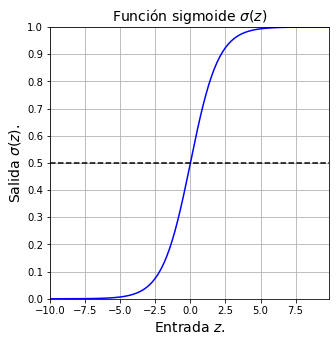

In [3]:
def sigmoide(z):
  sigma = 1.0/(1+np.exp(-z))
  return sigma

#Creación de datos de entrada y salida para la función sigmoide
z     = np.arange(-10,10,0.1).reshape((-1,1))  #Vector columna con valores z.
sigma = sigmoide(z)

#Gráfica de la función sigmoide.
figsize=(5,5)
plt.figure(figsize=figsize)
plt.plot(z,sigma,color='blue')
plt.plot(z,0.5*np.ones(z.shape),'k--')
plt.title('Función sigmoide $\sigma(z)$',fontsize=14)
plt.xlabel('Entrada $z$.',fontsize=14)
plt.ylabel('Salida $\sigma(z)$.',fontsize=14)
plt.autoscale(enable=True, axis='x', tight=True)
plt.autoscale(enable=True, axis='y', tight=True)
plt.yticks(np.arange(0,1.1,0.1))
plt.grid()
plt.show()

#Observe que cuando z es igual a 0, la función sigmoide arroja 0.5.
#Note también que la función sigmoide siempre está en el rango entre 0 y 1.

# Función de costo: Entropía cruzada (*cross entropy*).

\begin{equation}
J =  - \frac{1}{m}\sum\limits_{j = 1}^m {\left[ {{y^{\left( j \right)}}\log \left( {{y_{pred}}^{\left( j \right)}} \right) + \left( {1 - {y^{\left( j \right)}}} \right)\log \left( {1 - {y_{pred}}^{\left( j \right)}} \right)} \right]}
\end{equation}

Información adicional: https://en.wikipedia.org/wiki/Cross_entropy


Donde:

\begin{equation}
{y_{pred}}^{\left( j \right)}\left( {{\bf{w}},{{\bf{x}}^{\left( j \right)}}} \right) = \frac{1}{{1 + {e^{ - {{\bf{w}}^T}{{\bf{x}}^{\left( j \right)}}}}}}
\end{equation}

#### Pregunta 0.1

¿Qué ocurre en los siguientes casos con el término al interior de la sumatoria en la ecuación de la función de costo?:

*   $y^{\left( j \right)}=0$,  ${y_{pred}}^{\left( j \right)}=0$.
*   $y^{\left( j \right)}=0$,  ${y_{pred}}^{\left( j \right)}=1$.
*   $y^{\left( j \right)}=1$,  ${y_{pred}}^{\left( j \right)}=0$.
*   $y^{\left( j \right)}=1$,  ${y_{pred}}^{\left( j \right)}=1$.

In [4]:
#### Respuesta Pregunta 0.1
def costFunction(real, predicha):
    cost = real*np.log(predicha) +(1-real)*np.log(predicha)
    return cost

# Caso 1
real = 0 ; predicha = 0
cost = costFunction(real, predicha)
print(cost)
# * En el primer caso como el valor real = 0 y el valor predicho es igual a 0, quiere decir que se puede esperar un comportamiento optimo

# Caso 2
real = 0 ; predicha = 1
cost = costFunction(real, predicha)
print(cost)
# * En el segundo caso como el valor real = 0 y el valor predicho es igual a 1, quiere decir que no se puede esperar un buen comportamiento

# Caso 3
real = 1 ; predicha = 0
cost = costFunction(real, predicha)
print(cost)
# * En el tercer caso como el valor real = 1 y el valor predicho es igual a 0, quiere decir que no se puede esperar un buen comportamiento

# Caso 4
real = 1 ; predicha = 1
cost = costFunction(real, predicha)
print(cost)
# * En el cuarto caso como el valor real = 1 y el valor predicho es igual a 1, quiere decir que se puede esperar un comportamiento optimo

nan
0.0
nan
0.0


/var/folders/m1/y83lzzrj3g9cwk3vm5gds84r0000gn/T/ipykernel_82940/3646201272.py:3: RuntimeWarning: divide by zero encountered in log
  cost = real*np.log(predicha) +(1-real)*np.log(predicha)
/var/folders/m1/y83lzzrj3g9cwk3vm5gds84r0000gn/T/ipykernel_82940/3646201272.py:3: RuntimeWarning: invalid value encountered in double_scalars
  cost = real*np.log(predicha) +(1-real)*np.log(predicha)


#### Pregunta 0.2

¿Qué puede concluir sobre la forma en la que se afecta la función de costo cuando la predicción es correcta? 


#### Respuesta Pregunta 0.2
La función de costo es una función que nos permite medir el error de nuestro modelo, es decir, nos permite saber si nuestro modelo esta funcionando de manera correcta o no. Asimismo, cuando la predicción es correcta, la función de costo se miniza y se mostrara lo mas cerca posible a 0.

#### Pregunta 0.3

¿Qué ocurre cuando la predicción es incorrecta? 

#### Respuesta Pregunta 0.3
Cuando la predicción es incorrecta el costo es muy alto, es decir, la función de costo se maximiza y tiende a infinito.

# Gradiente Descendente

Paso 1: Asignar valores iniciales a los pesos $\omega$ y a la tasa de aprendizaje $\alpha$.

Paso 2: Calcular el gradiente de J como:

\begin{equation}
\nabla J = {\left[ {\frac{{\partial J}}{{\partial {w_0}}},\frac{{\partial J}}{{\partial {w_1}}},....,\frac{{\partial J}}{{\partial {w_i}}},....,\frac{{\partial J}}{{\partial {w_n}}}} \right]^T}
\end{equation}

Utilizando cálculo se puede demostrar que la expresión $\frac{{\partial J}}{{\partial {w_i}}}$ se puede representar como:

\begin{equation}
\frac{{\partial J}}{{\partial {w_i}}} = \frac{1}{m}\sum\limits_{j = 1}^m {\left[ {\left( {{y_{pred}}^{\left( j \right)} - {y^{\left( j \right)}}} \right){x_i}^{\left( j \right)}} \right]} 
\end{equation}

Donde ${x_0}^{\left( j \right)} = 1$

Paso 3: Actualizar los pesos $\omega$ como:

\begin{equation}
{{w_i}_{\text{iteracion} + 1}} = {{w_i}_{\text{iteracion}}} - \alpha \nabla J
\end{equation}

Paso 4: Repetir los pasos 2 y 3 hasta lograr la convergencia o alcanzar la condición de parada.

# 1. Cargar Datos.

https://www.kaggle.com/datasets/uciml/breast-cancer-wisconsin-data

In [5]:
#df = pd.read_csv('water_potability.csv')
df = pd.read_csv('breast_cancer_wisconsin.csv')

# 2. Análisis Exploratorio de Datos.

### Información Básica del Dataset

In [6]:
df.shape

(569, 33)

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 569 entries, 0 to 568
Data columns (total 33 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   id                       569 non-null    int64  
 1   diagnosis                569 non-null    object 
 2   radius_mean              569 non-null    float64
 3   texture_mean             569 non-null    float64
 4   perimeter_mean           569 non-null    float64
 5   area_mean                569 non-null    float64
 6   smoothness_mean          569 non-null    float64
 7   compactness_mean         569 non-null    float64
 8   concavity_mean           569 non-null    float64
 9   concave points_mean      569 non-null    float64
 10  symmetry_mean            569 non-null    float64
 11  fractal_dimension_mean   569 non-null    float64
 12  radius_se                569 non-null    float64
 13  texture_se               569 non-null    float64
 14  perimeter_se             5

In [8]:
df['diagnosis'] = df['diagnosis'].astype('category')

In [9]:
df = df.replace(['M','B'],[1,0])

In [10]:
df['diagnosis'] = df['diagnosis'].astype(int)

In [11]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 569 entries, 0 to 568
Data columns (total 33 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   id                       569 non-null    int64  
 1   diagnosis                569 non-null    int64  
 2   radius_mean              569 non-null    float64
 3   texture_mean             569 non-null    float64
 4   perimeter_mean           569 non-null    float64
 5   area_mean                569 non-null    float64
 6   smoothness_mean          569 non-null    float64
 7   compactness_mean         569 non-null    float64
 8   concavity_mean           569 non-null    float64
 9   concave points_mean      569 non-null    float64
 10  symmetry_mean            569 non-null    float64
 11  fractal_dimension_mean   569 non-null    float64
 12  radius_se                569 non-null    float64
 13  texture_se               569 non-null    float64
 14  perimeter_se             5

In [12]:
df.head()

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,...,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst,Unnamed: 32
0,842302,1,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,...,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890,NaN
1,842517,1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,...,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902,NaN
2,84300903,1,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,...,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758,NaN
3,84348301,1,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,...,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300,NaN
4,84358402,1,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,...,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678,NaN


### Distribución de la Variable Target

Conteo de objetos por clase:
0    357
1    212
Name: diagnosis, dtype: int64



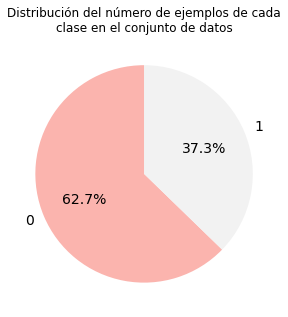

In [13]:
#Econtremos cómo están repartidas las categorías en el conjunto de datos. 
Target = 'diagnosis'
conteo_de_ejemplos_por_clase = df[Target].value_counts()
print('Conteo de objetos por clase:\n', conteo_de_ejemplos_por_clase, '\n',sep='')
#print('El tipo de este objeto es: ', type(conteo_de_ejemplos_por_clase),'\n')

#Revisemos esta información de forma gráfica.
#-------------------------------------------------------------------------------
#Opción 1: usemos un gráfico tipo pastel desde pandas. 
#-------------------------------------------------------------------------------
conteo_de_ejemplos_por_clase.plot(kind='pie', 
                                    figsize=(5, 5),
                                    autopct='%1.1f%%',  #Esto muestra úicamente el porcentaje de ejemplos de cada categoría en el gráfico. 
                                    #autopct=lambda pct: '{:.1f}%\n({:d})'.format(pct, int(pct/100.*conteo_de_ejemplos_por_clase.sum())), #Con esta función lambda se puede mostrar el porcentaje y el número absoluto de ejemplos en cada categoría. 
                                    startangle=90,       #Esto define la orientación de la línea vertical inicial de las divisiones del pie chart.
                                    fontsize=14,         #Tamaño de los textos.         
                                    cmap='Pastel1')      #Para otros color maps visite: https://matplotlib.org/stable/tutorials/colors/colormaps.html
titulo = 'Distribución del número de ejemplos de cada\nclase en el conjunto de datos'
plt.title(titulo) 
plt.ylabel('') #Esto es para evitar un texto en el eje y que diría Species.
plt.show()


### Correlación antes de hacer limpieza

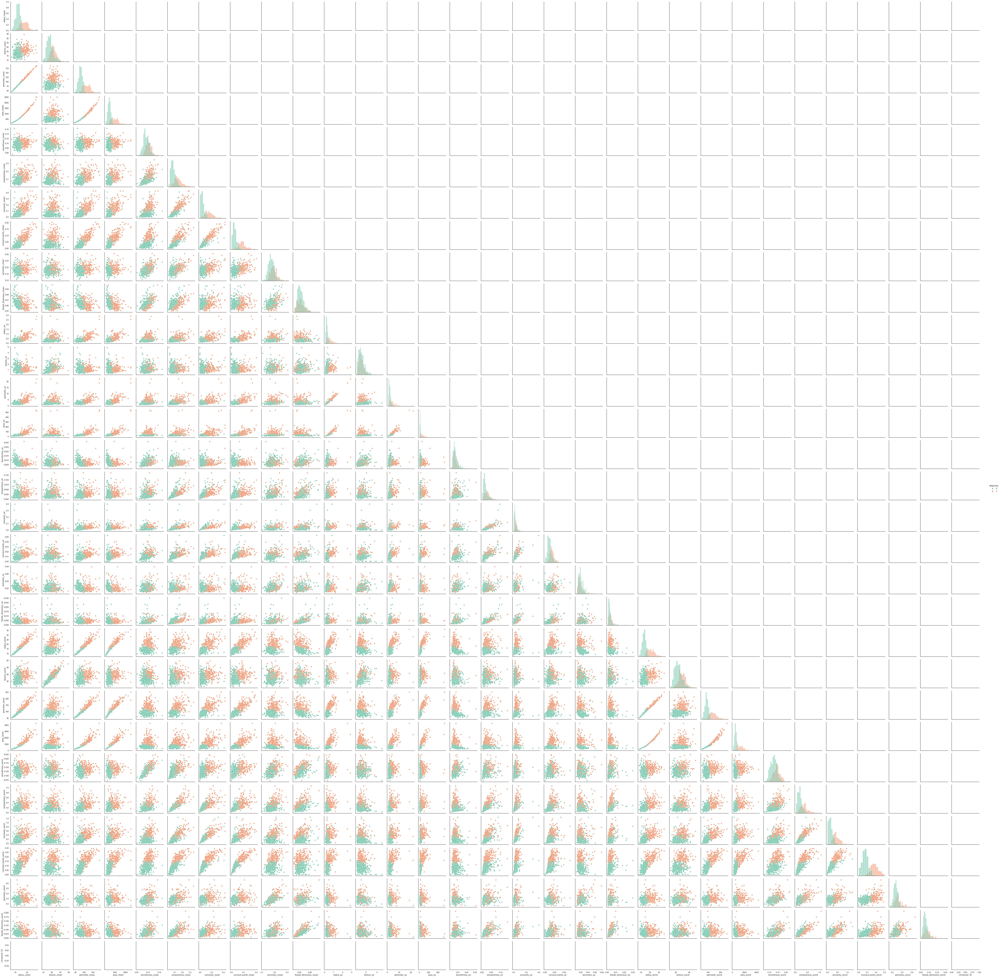

In [14]:
sns.set(style='white')
sns.set_palette('Set2')

g = sns.PairGrid(data=df.iloc[:,1:],hue=Target,diag_sharey=False, corner=False)

g.map_diag(sns.histplot)
g.map_lower(sns.scatterplot)

g.add_legend()
plt.show()

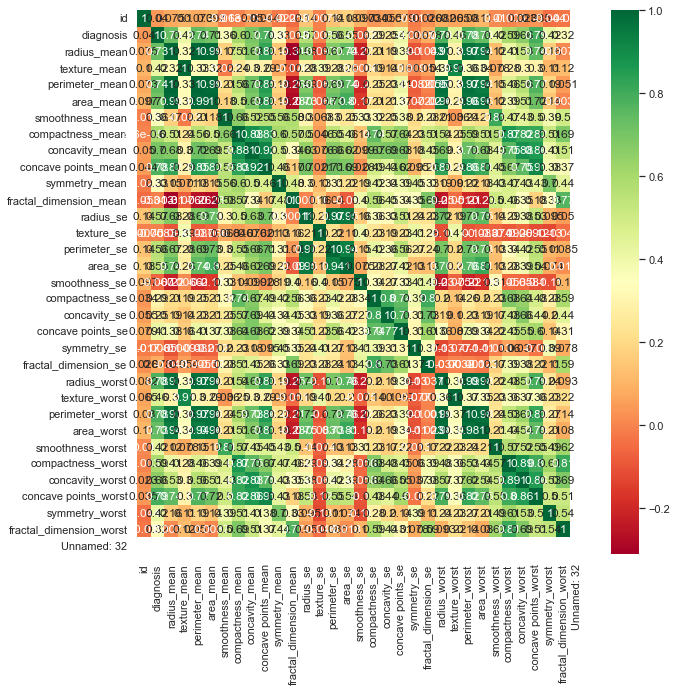

In [15]:
plt.figure(figsize=(10, 10))
ax = sns.heatmap(df.corr(),annot=True,cmap='RdYlGn')

#### Vamos a utilizar los valores medios de los atributos

In [16]:
# 1   diagnosis                569 non-null    object 
# 2   radius_mean              569 non-null    float64
# 3   texture_mean             569 non-null    float64
# 4   perimeter_mean           569 non-null    float64
# 5   area_mean                569 non-null    float64
# 6   smoothness_mean          569 non-null    float64
# 7   compactness_mean         569 non-null    float64
# 8   concavity_mean           569 non-null    float64
# 9   concave points_mean      569 non-null    float64
# 10  symmetry_mean            569 non-null    float64
# 11  fractal_dimension_mean   569 non-null    float64

In [17]:
df_clean = deepcopy(df.iloc[:,1:12])
print(type(df_clean))
print(df_clean.shape)

<class 'pandas.core.frame.DataFrame'>
(569, 11)


In [18]:
df_clean.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 569 entries, 0 to 568
Data columns (total 11 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   diagnosis               569 non-null    int64  
 1   radius_mean             569 non-null    float64
 2   texture_mean            569 non-null    float64
 3   perimeter_mean          569 non-null    float64
 4   area_mean               569 non-null    float64
 5   smoothness_mean         569 non-null    float64
 6   compactness_mean        569 non-null    float64
 7   concavity_mean          569 non-null    float64
 8   concave points_mean     569 non-null    float64
 9   symmetry_mean           569 non-null    float64
 10  fractal_dimension_mean  569 non-null    float64
dtypes: float64(10), int64(1)
memory usage: 49.0 KB


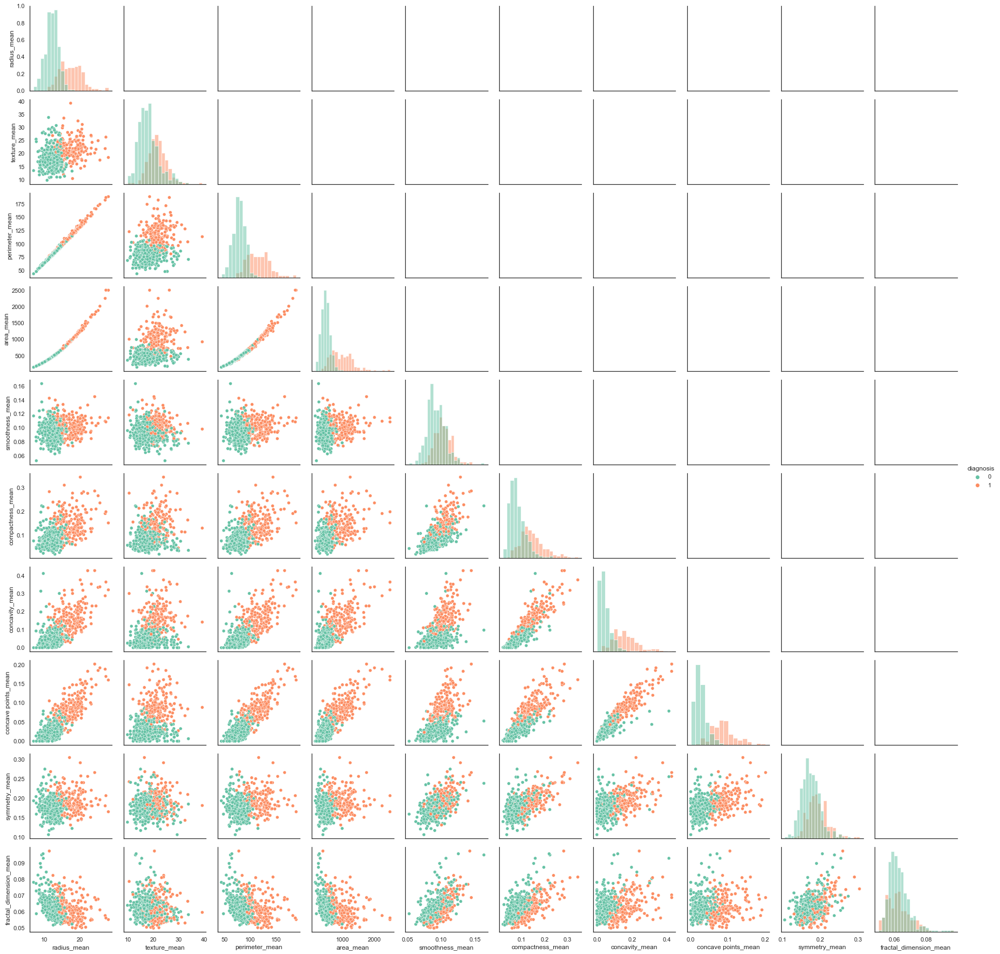

In [19]:
sns.set(style='white')
sns.set_palette('Set2')

g = sns.PairGrid(data=df_clean,hue=Target,diag_sharey=False, corner=False)

g.map_diag(sns.histplot)
g.map_lower(sns.scatterplot)

g.add_legend()
plt.show()

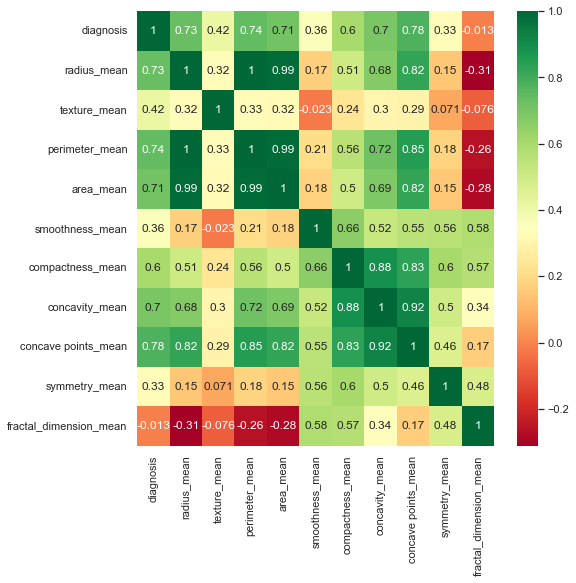

In [20]:
plt.figure(figsize=(8, 8))
ax = sns.heatmap(df_clean.corr(),annot=True,cmap='RdYlGn')

# 3. Modelo.

**Inicialmente vamos a utilizar el modelo para clasificación Regresión Logística (Logistic Regression).**

## Construcción del Modelo

In [21]:
# https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.LogisticRegression.html

from sklearn.linear_model import LogisticRegression

log_reg_1 = LogisticRegression()

## Baseline

In [22]:
count_p = (df_clean[Target] == 1).sum()
print("Número de Observaciones para Maligno: ", count_p)

count_n = (df_clean[Target] == 0).sum()
print("Número de Observaciones para Benigno: ", count_n)

print("Línea Base: %.2f" % (100*max(count_n,count_p)/(count_p+count_n)))

Número de Observaciones para Maligno:  212
Número de Observaciones para Benigno:  357
Línea Base: 62.74


## Selección de Predictores

In [23]:
#Nombre de la salida deseada:
nombre_de_la_variable_de_salida='diagnosis' 

#Nombre de los posibles atributos de entrada:
# 1   diagnosis                569 non-null    object 
# 2   radius_mean              569 non-null    float64
# 3   texture_mean             569 non-null    float64
# 4   perimeter_mean           569 non-null    float64
# 5   area_mean                569 non-null    float64
# 6   smoothness_mean          569 non-null    float64
# 7   compactness_mean         569 non-null    float64
# 8   concavity_mean           569 non-null    float64
# 9   concave points_mean      569 non-null    float64
# 10  symmetry_mean            569 non-null    float64
# 11  fractal_dimension_mean   569 non-null    float64

nombre_de_las_variables_de_entrada = ['perimeter_mean','texture_mean']

df_y = df_clean[nombre_de_la_variable_de_salida]
print('Dataframe de salida:')
print(df_y)

df_x = deepcopy(df_clean[nombre_de_las_variables_de_entrada])
print('\nDataframe de entrada:')
print(type(df_x))
print(df_x)

Dataframe de salida:
0      1
1      1
2      1
3      1
4      1
      ..
564    1
565    1
566    1
567    1
568    0
Name: diagnosis, Length: 569, dtype: int64

Dataframe de entrada:
<class 'pandas.core.frame.DataFrame'>
     perimeter_mean  texture_mean
0            122.80         10.38
1            132.90         17.77
2            130.00         21.25
3             77.58         20.38
4            135.10         14.34
..              ...           ...
564          142.00         22.39
565          131.20         28.25
566          108.30         28.08
567          140.10         29.33
568           47.92         24.54

[569 rows x 2 columns]


In [24]:
# Vamos a dividir los datos en un conjunto de entrenamiento, un conjunto de desarrollo o validación, y un conjunto de pruebas.
mezclar_los_datos       = True #Vamos a mezclar de forma aleatoria los datos antes de particionarlos. 
valor_semilla_aleatoria = 42
4#Esto es útil si se quiere garantizar la repetibilidad 
                               #de la partición de datos en ejecuciones sucesivas de su notebook o script. 

#Porcentajes de división de datos. 
particion_para_entrenamiento = 0.6  #Dejamos el 60% de los datos para el conjunto de entrenamiento (training set).
particion_para_desarrollo    = 0.2  #Dejamos el 20% de los datos para el conjunto de desarrollo (dev set).
                                    #Este conjunto se conoce también como: selección del modelo, validación, o hold-out.
particion_para_entrenamiento_y_desarrollo = particion_para_entrenamiento+particion_para_desarrollo #Variable auxiliar. 
particion_para_pruebas       = 1.0-particion_para_entrenamiento_y_desarrollo #Dejamos los otros datos, correspondiente al 20%, para el conjunto de pruebas. 

#Hacemos la partición para obtener el conjunto de pruebas y el "resto" (i.e.: entrenamiento y desarrollo).
df_x_rest, df_x_test, df_y_rest, df_y_test = train_test_split(df_x,                                         #100% de los datos de entrada. 
                                                              df_y,                                         #100% de los datos de salida. 
                                                              test_size=particion_para_pruebas, 
                                                              random_state=valor_semilla_aleatoria, 
                                                              shuffle=mezclar_los_datos)

#Del "resto" obtenemos los conjuntos de entrenamiento y desarrollo. 
df_x_train, df_x_val, df_y_train, df_y_val = train_test_split(df_x_rest,                                    #Una fracción de los datos de entrada. 
                                                              df_y_rest,                                    #Una fracción de los datos de salida.        
                                                              test_size=particion_para_desarrollo/particion_para_entrenamiento_y_desarrollo, #cuidado! este es el porcentaje respecto al "resto". 
                                                              random_state=valor_semilla_aleatoria, 
                                                              shuffle=False) #Los datos ya se mezclaron arriba, no es necesario repetirlo acá.  

print('-----------------------------------------------------------------------')
print('Conjunto de datos de entrenamiento {:1.0f}%'.format(particion_para_entrenamiento*100))
print('-----------------------------------------------------------------------')
print(df_x_train.info(),'\n')

print('-----------------------------------------------------------------------')
print('Conjunto de datos de desarrollo {:1.0f}%'.format(particion_para_desarrollo*100))
print('-----------------------------------------------------------------------')
print(df_x_val.info(),'\n')

print('-----------------------------------------------------------------------')
print('Conjunto de datos de prueba {:1.0f}%'.format(particion_para_pruebas*100))
print('-----------------------------------------------------------------------')
print(df_x_test.info(),'\n',sep='')

conteo_de_ejemplos_por_clase = df_y_train.value_counts()
print('Conteo de objetos por clase en el conjunto de entrenamiento:\n', conteo_de_ejemplos_por_clase, '\n',sep='')
print('El porcentaje de tipo 1 en el conjunto de entrenamiento es: ', 100*(conteo_de_ejemplos_por_clase[1]/sum(conteo_de_ejemplos_por_clase)),'%\n')

conteo_de_ejemplos_por_clase = df_y_val.value_counts()
print('Conteo de objetos por clase en el conjunto de validación:\n', conteo_de_ejemplos_por_clase, '\n',sep='')
print('El porcentaje de tipo 1 en el conjunto de validación es: ', 100*(conteo_de_ejemplos_por_clase[1]/sum(conteo_de_ejemplos_por_clase)),'%\n')

conteo_de_ejemplos_por_clase = df_y_test.value_counts()
print('Conteo de objetos por clase en el conjunto de prueba:\n', conteo_de_ejemplos_por_clase, '\n',sep='')
print('El porcentaje de tipo 1 en el conjunto de prueba es: ', 100*(conteo_de_ejemplos_por_clase[1]/sum(conteo_de_ejemplos_por_clase)),'%\n')

-----------------------------------------------------------------------
Conjunto de datos de entrenamiento 60%
-----------------------------------------------------------------------
<class 'pandas.core.frame.DataFrame'>
Int64Index: 341 entries, 68 to 200
Data columns (total 2 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   perimeter_mean  341 non-null    float64
 1   texture_mean    341 non-null    float64
dtypes: float64(2)
memory usage: 8.0 KB
None 

-----------------------------------------------------------------------
Conjunto de datos de desarrollo 20%
-----------------------------------------------------------------------
<class 'pandas.core.frame.DataFrame'>
Int64Index: 114 entries, 134 to 102
Data columns (total 2 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   perimeter_mean  114 non-null    float64
 1   texture_mean    114 non-null    float64
dtypes: float64(2)


## La Normalización o Estandarización es opcional

In [25]:
from sklearn.preprocessing import MinMaxScaler,StandardScaler

scale=StandardScaler()
df_x_train=scale.fit_transform(df_x_train)
df_x_val=scale.transform(df_x_val)
df_x_test=scale.transform(df_x_test)

## Entrenamiento

In [26]:
log_reg_1.fit(df_x_train,df_y_train)

LogisticRegression()

In [27]:
log_reg_1.get_params()

{'C': 1.0,
 'class_weight': None,
 'dual': False,
 'fit_intercept': True,
 'intercept_scaling': 1,
 'l1_ratio': None,
 'max_iter': 100,
 'multi_class': 'auto',
 'n_jobs': None,
 'penalty': 'l2',
 'random_state': None,
 'solver': 'lbfgs',
 'tol': 0.0001,
 'verbose': 0,
 'warm_start': False}

# 4. Evaluación

### Inicialmente se va a evaluar la predicción en el conjunto de entrenamiento.

In [28]:
# predict class
y_pred_train = log_reg_1.predict(df_x_train)

Accuracy: 0.9062
TPR: 0.8197
FPR: 0.0457


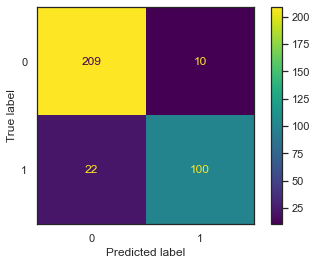

In [29]:
cm = metrics.confusion_matrix(df_y_train,y_pred_train)
TP = cm[1,1]
TN = cm[0,0]
FP = cm[0,1]
FN = cm[1,0]
TPR = TP/(TP+FN)
FPR = FP/(FP+TN)
acc = (TP+TN)/(TP+TN+FP+FN)
print('Accuracy: %.4f' % acc)
print('TPR: %.4f' % TPR)
print('FPR: %.4f' % FPR)
disp = metrics.ConfusionMatrixDisplay(confusion_matrix = cm)
disp.plot()
plt.show()

### Ahora se va a evaluar la predicción en el conjunto de validación.

In [30]:
# predict class
y_pred_val = log_reg_1.predict(df_x_val)

Accuracy: 0.8421
TPR: 0.7660
FPR: 0.1045


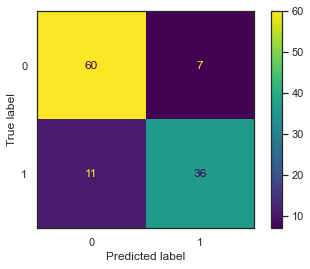

In [31]:
cm = metrics.confusion_matrix(df_y_val,y_pred_val)
TP = cm[1,1]
TN = cm[0,0]
FP = cm[0,1]
FN = cm[1,0]
TPR = TP/(TP+FN)
FPR = FP/(FP+TN)
acc = (TP+TN)/(TP+TN+FP+FN)
print('Accuracy: %.4f' % acc)
print('TPR: %.4f' % TPR)
print('FPR: %.4f' % FPR)
disp = metrics.ConfusionMatrixDisplay(confusion_matrix = cm)
disp.plot()
plt.show()

### En este momento vamos a hacer la evaluación ajustando el umbral de clasificación. Pero primero debemos determinar el umbral, para lo cual vamos a usar la curva ROC y la métrica AUC.

In [32]:
# predict probabilities
y_prob = log_reg_1.predict_proba(df_x_train)

In [33]:
print(y_prob)

[[9.96647398e-01 3.35260173e-03]
 [4.36657962e-04 9.99563342e-01]
 [9.98360999e-01 1.63900120e-03]
 [9.36290081e-01 6.37099192e-02]
 [9.95763343e-01 4.23665739e-03]
 [1.51660558e-01 8.48339442e-01]
 [5.28194221e-01 4.71805779e-01]
 [9.85120303e-01 1.48796974e-02]
 [9.48760381e-01 5.12396189e-02]
 [9.22191313e-03 9.90778087e-01]
 [8.64617697e-01 1.35382303e-01]
 [3.12604109e-03 9.96873959e-01]
 [6.08442415e-01 3.91557585e-01]
 [9.93758908e-01 6.24109165e-03]
 [8.96783545e-01 1.03216455e-01]
 [3.30900821e-03 9.96690992e-01]
 [1.92698352e-01 8.07301648e-01]
 [3.51723150e-02 9.64827685e-01]
 [7.52555184e-01 2.47444816e-01]
 [9.60532859e-01 3.94671411e-02]
 [7.92818855e-01 2.07181145e-01]
 [6.11695083e-01 3.88304917e-01]
 [7.98148839e-01 2.01851161e-01]
 [9.82982491e-01 1.70175087e-02]
 [7.59195277e-01 2.40804723e-01]
 [5.52917999e-01 4.47082001e-01]
 [9.84663210e-01 1.53367903e-02]
 [6.49545355e-03 9.93504546e-01]
 [9.97239578e-01 2.76042222e-03]
 [9.70735146e-01 2.92648537e-02]
 [7.187963

### Curva ROC (Receiver Operating Characteristic) y Métrica AUC(Area Under the Curve)

In [34]:
from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score

def curva_roc(y_prob, df_y):
    
    ns_prob = [0 for _ in range(len(df_y))]

    # keep probabilities for the positive outcome only
    y_prob_val_c1 = y_prob[:, 1]

    # calculate scores
    ns_auc = roc_auc_score(df_y, ns_prob)
    log_reg_auc = roc_auc_score(df_y, y_prob_val_c1)

    # summarize scores
    print('No Skill: ROC AUC=%.4f' % (ns_auc))
    print('Logistic: ROC AUC=%.4f' % (log_reg_auc))

    # calculate roc curves
    ns_fpr, ns_tpr, _ = roc_curve(df_y, ns_prob)
    log_reg_fpr, log_reg_tpr, ths = roc_curve(df_y, y_prob_val_c1)

    # plot the roc curve for the model
    plt.plot(ns_fpr, ns_tpr, linestyle='--', color = 'b', label='No Skill')
    plt.plot(log_reg_fpr, log_reg_tpr, marker='.', color = 'r', label='Logistic')

    # axis labels
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    # show the legend
    plt.legend()
    # show the plot
    plt.show()
    
    return ths

No Skill: ROC AUC=0.5000
Logistic: ROC AUC=0.9569


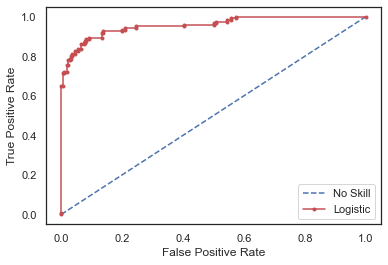

In [35]:
ths = curva_roc(y_prob,df_y_train)

### Ahora vamos a encontrar el umbral que genera el punto más cercano al ideal FPR=0 y TPR=1

In [36]:
# keep probabilities for the positive outcome only

def umbral_optimo(y_prob,df_y,ths):
    
    y_prob_c1 = y_prob[:, 1]
    roc = []
    for j in range (len(ths)):
        y_pred = np.zeros(len(y_prob_c1))
        for i in range(len(y_prob_c1)):
            if (y_prob_c1[i] >= ths[j]):
                y_pred[i] = 1
        cm = metrics.confusion_matrix(df_y,y_pred)
        TP = cm[1,1]
        TN = cm[0,0]
        FP = cm[0,1]
        FN = cm[1,0]
        TPR = TP/(TP+FN)
        FPR = FP/(FP+TN)
        roc.append((TPR,FPR,ths[j]))    

    roc = np.array(roc)  
    
    distance_to_top_left_corner = []

    for i in range(len(roc)):
        distance_to_top_left_corner.append( np.sqrt( ((roc[i,1]-0)**2)+((roc[i,0]-1)**2) ) )

    index_of_best_threshold = distance_to_top_left_corner.index(min(distance_to_top_left_corner)) #Retorna el índice con la menor distancia
    best_threshold          = ths[index_of_best_threshold]
    #print('El mejor umbral para el conjunto de validación es {:.4f}.'.format(best_threshold))
    return best_threshold

In [37]:
best_th = umbral_optimo(y_prob,df_y_train,ths)
print('El mejor umbral es {:.4f}.'.format(best_th))

El mejor umbral es 0.3412.


### Con ese umbral asignamos las clases y probamos la clasificación en el conjunto de entranamiento y validación.

Accuracy: 0.9032
TPR: 0.8934
FPR: 0.0913


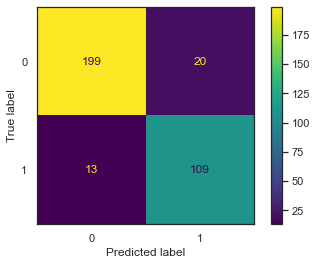

In [38]:
# predict probabilities on the training set
y_prob = log_reg_1.predict_proba(df_x_train)

# predict class
y_prob_c1 = y_prob[:, 1]
th = best_th
y_pred = np.zeros(len(y_prob_c1))
for i in range(len(y_prob_c1)):
    if (y_prob_c1[i] >= th):
        y_pred[i] = 1

#Evaluation on the training set
cm = metrics.confusion_matrix(df_y_train,y_pred)
TP = cm[1,1]
TN = cm[0,0]
FP = cm[0,1]
FN = cm[1,0]
TPR = TP/(TP+FN)
FPR = FP/(FP+TN)
acc = (TP+TN)/(TP+TN+FP+FN)
print('Accuracy: %.4f' % acc)
print('TPR: %.4f' % TPR)
print('FPR: %.4f' % FPR)
disp = metrics.ConfusionMatrixDisplay(confusion_matrix = cm)
disp.plot()
plt.show()

Accuracy: 0.8421
TPR: 0.8298
FPR: 0.1493


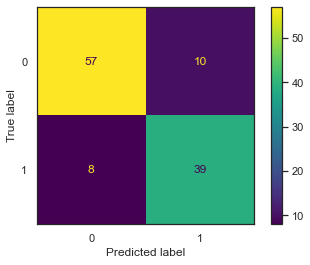

In [39]:
# predict probabilities on the validation set
y_prob = log_reg_1.predict_proba(df_x_val)

# predict class
y_prob_c1 = y_prob[:, 1]
th = best_th
y_pred = np.zeros(len(y_prob_c1))
for i in range(len(y_prob_c1)):
    if (y_prob_c1[i] >= th):
        y_pred[i] = 1

#Evaluation on the training set
cm = metrics.confusion_matrix(df_y_val,y_pred)
TP = cm[1,1]
TN = cm[0,0]
FP = cm[0,1]
FN = cm[1,0]
TPR = TP/(TP+FN)
FPR = FP/(FP+TN)
acc = (TP+TN)/(TP+TN+FP+FN)
print('Accuracy: %.4f' % acc)
print('TPR: %.4f' % TPR)
print('FPR: %.4f' % FPR)
disp = metrics.ConfusionMatrixDisplay(confusion_matrix = cm)
disp.plot()
plt.show()

# Modelo

**Ahora vamos a utilizar el modelo para clasificación Bayes Ingenuo (Naïve Bayes).**

#### Bayes’ Theorem

Bayes’ Theorem finds the probability of an event occurring given the probability of another event that has already occurred. Bayes’ theorem is stated mathematically as the following equation:

$P(A|B) = \frac{P(B|A) P(A)}{P(B)}$

where A and B are events and P(B) ≠ 0.

    Basically, we are trying to find probability of event A, given the event B is true. Event B is also termed as evidence.
    P(A) is the priori of A (the prior probability, i.e. Probability of event before evidence is seen). The evidence is an attribute value of an unknown instance(here, it is event B).
    P(A|B) is a posteriori probability of B, i.e. probability of event after evidence is seen.

Now, with regards to the classification problem, we can apply Bayes’ theorem in following way:

$P(y|X) = \frac{P(X|y) P(y)}{P(X)}$

where, y is class variable and X is a dependent feature vector (of size n) where:

$X = (x_1,x_2,x_3,.....,x_n)$

#### Naive assumption

Now, its time to put a naive assumption to the Bayes’ theorem, which is, independence among the features. So now, we split evidence into the independent parts.

Now, if any two events A and B are independent, then,

$P(A,B) = P(A)P(B)$

Hence, we reach to the result:

$P(y|x_1,...,x_n) = \frac{ P(x_1|y)P(x_2|y)...P(x_n|y)P(y)}{P(x_1)P(x_2)...P(x_n)}$

which can be expressed as:

$P(y|x_1,...,x_n) = \frac{P(y)\prod_{i=1}^{n}P(x_i|y)}{P(x_1)P(x_2)...P(x_n)}$

Now, as the denominator remains constant for a given input, we can remove that term:

$P(y|x_1,...,x_n)\propto P(y)\prod_{i=1}^{n}P(x_i|y)$

Now, we need to create a classifier model. For this, we find the probability of given set of inputs for all possible values of the class variable y and pick up the output with maximum probability. This can be expressed mathematically as:

$y = argmax_{y} P(y)\prod_{i=1}^{n}P(x_i|y)$

So, finally, we are left with the task of calculating P(y) and P(xi | y).

Please note that P(y) is also called class probability and P(xi | y) is called conditional probability.

The different naive Bayes classifiers differ mainly by the assumptions they make regarding the distribution of P(xi | y).

One commonly used probability distribution is Gaussian.

### Para los atributos que vamos a utilizar en el entrenamiento del classificador vamos a mira el histograma y el KDE (Kernel Density Distribution).

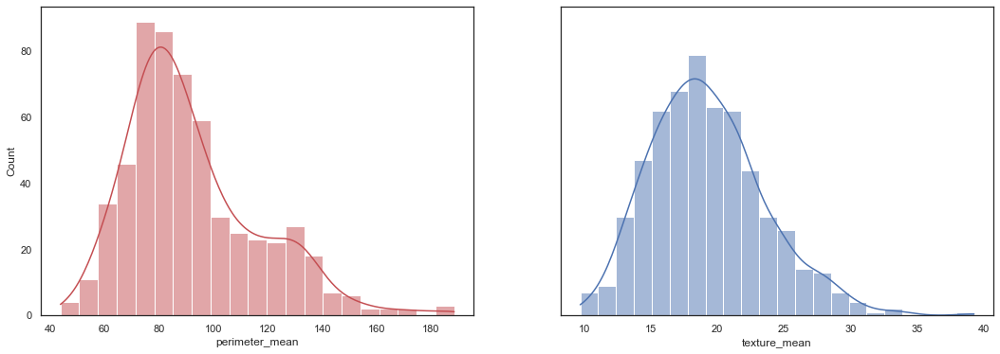

In [40]:
fig, axes = plt.subplots(1, 2, figsize=(18, 6), sharey=True)
sns.histplot(df_clean, ax=axes[0], x='perimeter_mean', kde=True, color='r')
sns.histplot(df_clean, ax=axes[1], x='texture_mean', kde=True, color='b')
plt.show()

## Construcción del Modelo.

In [41]:
from sklearn.naive_bayes import GaussianNB

gnb = GaussianNB()

## Entrenamiento del Modelo.

In [42]:
gnb.fit(df_x_train, df_y_train)

GaussianNB()

# 4. Evaluación

#### Pregunta 4.1

Haga la evaluación de la predicción del modelo de clasificación Bayesiano Ingenuo en el conjunto de entrenamiento y validación. Compare los resultados obtenidos con los del clasificador de regresión logística.

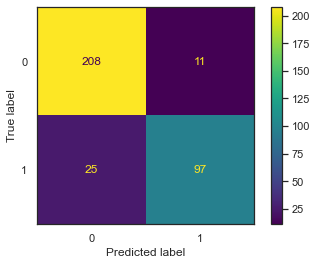

Accuracy: 0.8944
TPR: 0.7951
FPR: 0.0502


In [43]:
#Respuesta pregunta 4.1

y_pred = gnb.predict(df_x_train)
cm = metrics.confusion_matrix(df_y_train,y_pred)
disp = metrics.ConfusionMatrixDisplay(confusion_matrix = cm)
disp.plot()
plt.show()

TP = cm[1,1]
TN = cm[0,0]
FP = cm[0,1]
FN = cm[1,0]
TPR = TP/(TP+FN)
FPR = FP/(FP+TN)
acc = (TP+TN)/(TP+TN+FP+FN)
print('Accuracy: %.4f' % acc)
print('TPR: %.4f' % TPR)
print('FPR: %.4f' % FPR);

Accuracy: 0.8333
TPR: 0.7447
FPR: 0.1045


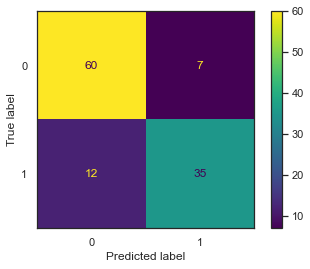

In [58]:
y_pred_val = gnb.predict(df_x_val)
cm = metrics.confusion_matrix(df_y_val,y_pred_val)
TP = cm[1,1]
TN = cm[0,0]
FP = cm[0,1]
FN = cm[1,0]
TPR = TP/(TP+FN)
FPR = FP/(FP+TN)
acc = (TP+TN)/(TP+TN+FP+FN)
print('Accuracy: %.4f' % acc)
print('TPR: %.4f' % TPR)
print('FPR: %.4f' % FPR)
disp = metrics.ConfusionMatrixDisplay(confusion_matrix = cm)
disp.plot()
plt.show()

Comparando estos dos resultados (modelo de regresión logística y el Bayesiano Ingenuo), el comportamiento del Bayesiano es inferior en el conjunto de entrenamiento y validación. Se puede decir que eso pasa debido a que el modelo de regresión tiene una mayor capacidad de generalización.

#### Pregunta 4.2

Haga la evaluación del modelo de clasificación Bayesiano Ingenuo en el conjunto de entrenamiento y validación usando la predicción de la probabilidad. Compare los resultados obtenidos con los del clasificador de regresión logística.

No Skill: ROC AUC=0.5000
GNB: ROC AUC=0.9530


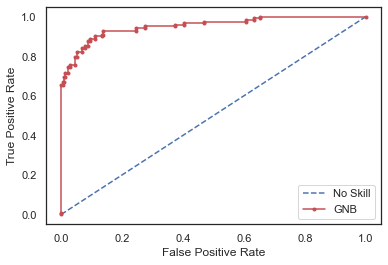

In [65]:
#Respuesta pregunta 4.2

y_prob_gnb = gnb.predict_proba(df_x_train)

def roc(y_prob, df_y):
    
    ns_prob = [0 for _ in range(len(df_y))]

    # keep probabilities for the positive outcome only
    y_prob_val_c1 = y_prob[:, 1]

    # calculate scores
    ns_auc = roc_auc_score(df_y, ns_prob)
    prob_pred_auc = roc_auc_score(df_y, y_prob_val_c1)

    # summarize scores
    print('No Skill: ROC AUC=%.4f' % (ns_auc))
    print('GNB: ROC AUC=%.4f' % (prob_pred_auc))

    # calculate roc curves
    ns_fpr, ns_tpr, _ = roc_curve(df_y, ns_prob)
    prob_pred_fpr, prob_pred_tpr, curves = roc_curve(df_y, y_prob_val_c1)

    # plot the roc curve for the model
    plt.plot(ns_fpr, ns_tpr, linestyle='--', color = 'b', label='No Skill')
    plt.plot(prob_pred_fpr, prob_pred_tpr, marker='.', color = 'r', label='GNB')

    # axis labels
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    # show the legend
    plt.legend()
    # show the plot
    plt.show()
    
    return curves

ths = roc(y_prob_gnb,df_y_train)


In [66]:
def umbral(y_prob,df_y,ths):
    
    y_prob_c1 = y_prob[:, 1]
    roc = []
    for j in range (len(ths)):
        y_pred = np.zeros(len(y_prob_c1))
        for i in range(len(y_prob_c1)):
            if (y_prob_c1[i] >= ths[j]):
                y_pred[i] = 1
        cm = metrics.confusion_matrix(df_y,y_pred)
        TP = cm[1,1]
        TN = cm[0,0]
        FP = cm[0,1]
        FN = cm[1,0]
        TPR = TP/(TP+FN)
        FPR = FP/(FP+TN)
        roc.append((TPR,FPR,ths[j]))    

    roc = np.array(roc)  
    
    distance_to_top_left_corner = []

    for i in range(len(roc)):
        distance_to_top_left_corner.append( np.sqrt( ((roc[i,1]-0)**2)+((roc[i,0]-1)**2) ) )

    index_of_best_threshold = distance_to_top_left_corner.index(min(distance_to_top_left_corner)) #Retorna el índice con la menor distancia
    best_threshold          = ths[index_of_best_threshold]
    #print('El mejor umbral para el conjunto de validación es {:.4f}.'.format(best_threshold))
    return best_threshold

best_th = umbral(y_prob_gnb,df_y_train,ths)
print('El mejor umbral es {:.4f}.'.format(best_th))

El mejor umbral es 0.2535.


Accuracy: 0.8944
TPR: 0.9016
FPR: 0.1096


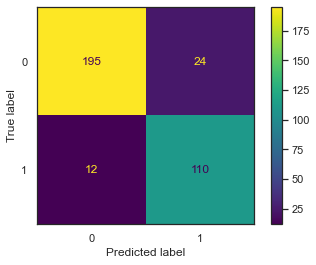

In [67]:
# predict probabilities on the training set
y_prob_gnb = gnb.predict_proba(df_x_train)

# predict class
y_prob_c1 = y_prob_gnb[:, 1]
th = best_th
y_pred = np.zeros(len(y_prob_c1))
for i in range(len(y_prob_c1)):
    if (y_prob_c1[i] >= th):
        y_pred[i] = 1

#Evaluation on the training set
cm = metrics.confusion_matrix(df_y_train,y_pred)
TP = cm[1,1]
TN = cm[0,0]
FP = cm[0,1]
FN = cm[1,0]
TPR = TP/(TP+FN)
FPR = FP/(FP+TN)
acc = (TP+TN)/(TP+TN+FP+FN)
print('Accuracy: %.4f' % acc)
print('TPR: %.4f' % TPR)
print('FPR: %.4f' % FPR)
disp = metrics.ConfusionMatrixDisplay(confusion_matrix = cm)
disp.plot()
plt.show()

Accuracy: 0.8246
TPR: 0.8298
FPR: 0.1791


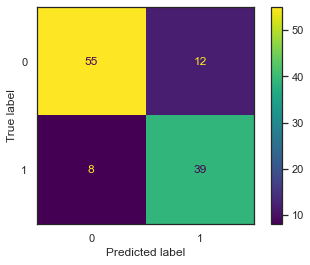

In [64]:
# predict probabilities on the validation set
y_prob_gnb = gnb.predict_proba(df_x_val)

# predict class
y_prob_c1 = y_prob_gnb[:, 1]
th = best_th
y_pred = np.zeros(len(y_prob_c1))
for i in range(len(y_prob_c1)):
    if (y_prob_c1[i] >= th):
        y_pred[i] = 1

#Evaluation on the validation set
cm = metrics.confusion_matrix(df_y_val,y_pred)
TP = cm[1,1]
TN = cm[0,0]
FP = cm[0,1]
FN = cm[1,0]
TPR = TP/(TP+FN)
FPR = FP/(FP+TN)
acc = (TP+TN)/(TP+TN+FP+FN)
print('Accuracy: %.4f' % acc)
print('TPR: %.4f' % TPR)
print('FPR: %.4f' % FPR)
disp = metrics.ConfusionMatrixDisplay(confusion_matrix = cm)
disp.plot()
plt.show()

De acuerdo a los resultados, el modelo Bayesiano usando la predicción de probabilidad tienen un comportamiento similar entre si teniendo en cuenta los resultados de las metricas de evaluación.

# PARTE 2: Clasificación multiclase usando una estrategia uno contra todos. 

Vamos a utilizar un subconjunto muy pequeño del conjunto de datos MNIST que Kaggle aloja en su repositorio (https://www.kaggle.com/oddrationale/mnist-in-csv). Utilizaremos un archivo para entrenamiento y otro diferente para pruebas: "mnist_train_small.csv", y "mnist_test_small.csv", respectivamente. Cada una de las filas de estos conjuntos de datos tiene 785 columnas. La primera columna se denomina 'label' y corresponde a la categoría que es un número entre 0 y 9. Las 784 columnas restantes corresponden a los valores de los píxeles de una imagen cuadrada de 28x28 en escala de grises, donde cada píxel sólo puede tomar valores entre 0 y 255. 

#  Carga e inspección de datos de entrenamiento

El conjunto de datos tiene 1000 observaciones
Nombres de las columnas: 
Index(['label', '1x1', '1x2', '1x3', '1x4', '1x5', '1x6', '1x7', '1x8', '1x9',
       ...
       '28x19', '28x20', '28x21', '28x22', '28x23', '28x24', '28x25', '28x26',
       '28x27', '28x28'],
      dtype='object', length=785)

Tipos de datos de cada columna: 
label    int64
1x1      int64
1x2      int64
1x3      int64
1x4      int64
         ...  
28x24    int64
28x25    int64
28x26    int64
28x27    int64
28x28    int64
Length: 785, dtype: object



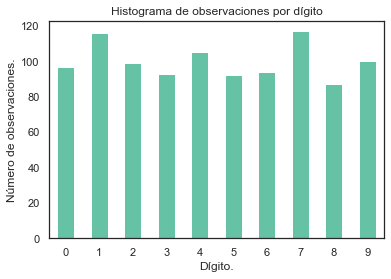

In [45]:
# Vamos a leer el conjunto de datos en un dataframe de pandas. 
df = pd.read_csv('mnist_train_small.csv')    #Ruta completa a la ubicación del archivo de interés.  

#¿Cuántas observaciones tenemos?
print('El conjunto de datos tiene {} observaciones'.format(df.shape[0]))  #Número de filas. 

#Revisemos los encabezados
print('Nombres de las columnas: \n', df.columns,'\n',sep='')

#Revisemos algunos atributos del conjunto de datos. 
print('Tipos de datos de cada columna: \n', df.dtypes,'\n',sep='')

#La salida es la columna 0 que corresponde a 'label'.
#Las columnas de la 1 hasta la última corresponden a los valores de píxeles en posiciones específicas (fila, columna) de una matriz cuadrada de 28 x 28 elementos. 
plt.figure
plt.hist(df['label'],bins=list(np.arange(-0.5,10.0,0.5)),align='left')
plt.xlim(-0.5,9.5)
plt.xticks(list(np.arange(0,10,1)));
plt.xlabel('Dígito.')
plt.ylabel('Número de observaciones.')
plt.title('Histograma de observaciones por dígito')
plt.show()



La salida deseada es 5.


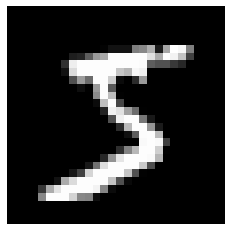


La salida deseada es 0.


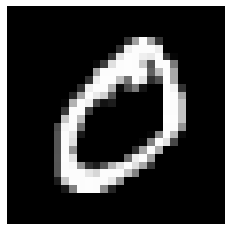


La salida deseada es 4.


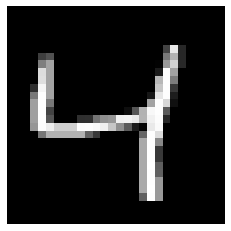

In [46]:
# Revisemos cómo se ven algunas de las observaciones cuando las graficamos como imágenes.
observaciones_a_visualizar = 3 #Número de observaciones a visualizar del conjunto de datos. 

for obs_number in range(observaciones_a_visualizar):
  output_of_single_observation = df.iloc[obs_number,0]   #Se extrae la salida correspondiente
  print('\nLa salida deseada es {}.'.format(output_of_single_observation))
  
  features_of_single_observation = df.iloc[obs_number,1:].values.reshape((28,28))   #Se extraen los atributos de entrada y se les cambia la forma, 
                                                                                    #de un vector fila a un arreglo cuadrado, note que np.sqrt(784)=28.
  plt.figure()
  plt.imshow(features_of_single_observation,cmap='gray') #Se grafica como una imagen en escala de grises. 
  plt.axis('off') #Esta instrucción quita los ejes x e y. 
  plt.show()

# Modelado paso a paso usando la estrategia uno contra todos.

In [51]:
df_current_digit = deepcopy(df)  #Copia profunda del dataset (pues necesitaremos modificar la columna 'label'). 

clf_dict = {} #Diccionario vacío, que va a contener los modelos de regresión logísitca "uno contra todos" para cada dígito.

for digit in range(10):  #En este ciclo digit varía entre 0 y 9.
  
  #Encontramos los índices que corresponden al dígito que nos interesa y al conjunto complemento. 
  idxs_digit     = df[df['label']==digit].index.values   #Atributos de entrada que tienen asociados por salida digit (i.e.: clase positiva).
  idxs_non_digit = df[df['label']!=digit].index.values   #Atributos de entrada que tienen asociados por salida valores diferentes a digit (i.e.: clase negativa).

  #Actualizamos la columna que almacenará la "salida deseada". 
  df_current_digit.at[idxs_digit,     'label'] = 1   #La salida deseada para los ejemplos que corresponden al dígito de interés se define en 1.
  df_current_digit.at[idxs_non_digit, 'label'] = 0   #En todos los otros casos la salida se define en 0. 

  # Se instancia el modelo.
  clf_dict[digit] = LogisticRegression()

  # Se entrene el modelo. 
  # Notas: * La salida deseada está en la columna 0.
  #        * Los atributos de entrada están entre la columna 1 y la última.  
  #        * Como sabemos que cada píxel sólo puede tomar valores entre 0 y 255, 
  #          vamos a dividir los atributos de entrada por 255 para agilizar el "solver" que usa scikit-learn. 
  clf_dict[digit] = clf_dict[digit].fit(df_current_digit.iloc[:,1:]/255.0, df_current_digit.iloc[:,0])

KeyError: 'label'

In [52]:
#Función auxiliar para la predicción en clasificación multiclase usando la estrategia uno contra todos. 
def predict_one_vs_all(clf_dict, df_x):
  df_y_pred_proba = pd.DataFrame()  #Creamos un dataframe vacío. Esta variable va a contener las predicciones probabilísticas. 
                                    #La fila j, va a contener las predicciones de todos los clasificadores cuando se presenta la observación de entrada x^(j).
                                    #La columna i va a representar la predicción del clasificador i. 
                                    
  #Iteramos sobre todos los clasificadores, para ello usamos la llave del diccionario.
  for digit in clf_dict:    
    df_y_pred_proba[digit] = clf_dict[digit].predict_proba(df_x)[:,1] #Almacenamos la probabilidad P(y=1) para cada observación de entrada para el clasificador actual. 

  df_y_pred = pd.DataFrame()  #Creamos un dataframe vacío. Después lo vamos a utilizar para guardar la mejor categoría de acuerdo con el esquema uno contra todos.
  df_y_pred['y_pred'] = df_y_pred_proba.idxmax(axis=1)  #Con esta instrucción pandas asigna para cada fila, el identificador de la columna que tiene el máximo valor. 
                                                        #Es decir que nos permite implementar fácilmente un "argmax".
  return df_y_pred

# Evaluación de los modelos usando el conjunto de pruebas. 

In [53]:
#uploaded = files.upload()  #Seleccionar el archivo "mnist_test_small.csv".

# Vamos a leer el conjunto de datos de pruebas en un dataframe de pandas. 
df_test = pd.read_csv('mnist_test_small.csv')    #Ruta completa a la ubicación del archivo de interés. 

In [54]:
df_x = df_test.iloc[:,1:]/255                     #Observaciones de los atributos de entrada. 
                                                  #Note que dividimos por 255 para ser consistentes con el pre-procesamiento
                                                  #que aplicamos durante el entrenamiento.
                                                   
df_y = df_test.iloc[:,0]                          #Observaciones de los atributos de salida deseados.

#Calculemos las predicciones. 
df_y_pred = predict_one_vs_all(clf_dict, df_x)    #Dataframe con las predicciones de salida en una sólo columna.
                                                  #Al usar la estrategia uno-contra-todos, cada fila sólo puede contener un dígito entre 0 y 9.
print('Predicciones:\n', df_y_pred)

Predicciones:
 Empty DataFrame
Columns: [y_pred]
Index: []


/var/folders/m1/y83lzzrj3g9cwk3vm5gds84r0000gn/T/ipykernel_82940/2655272973.py:12: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  df_y_pred['y_pred'] = df_y_pred_proba.idxmax(axis=1)  #Con esta instrucción pandas asigna para cada fila, el identificador de la columna que tiene el máximo valor.


ValueError: x and y must be the same size

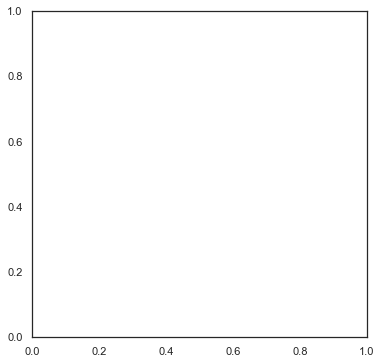

In [55]:
# Grafiquemos las predicciones vs. los valores reales 
# Pregunta: en una clasificación perfecta debería verse una nube de puntos sobre una línea recta con pendiente = 1. ¿Por qué? 
plt.figure(figsize=(6,6))
plt.scatter(df_y.values, df_y_pred.values)  
plt.plot(np.arange(0,10,1), np.arange(0,10,1),'purple') #Línea con pendiente = 1.
plt.title('Categorías predichas vs. categorías deseadas para todas las observaciones')
plt.ylabel('Categorías predichas.')
plt.xlabel('Categorías deseadas.')
plt.xlim(0,9)
plt.ylim(0,9);

In [56]:
# Grafiquemos la matriz de confusión. 
cm2 = metrics.confusion_matrix(df_y.values, df_y_pred.values)  #Una matriz de confusión para todas las categorías.  
print('Matriz de confusión:\n\n', cm2,'\n')
fig, ax = plt.subplots(figsize=(6,6))
plt.imshow(cm2, cmap='gray') #Acá definimos el mapa de color del gráfico.
plt.colorbar()
nombres_de_las_variables_de_salida2 = [str(digit) for digit in np.arange(0, 10, 1) ]  #Lista con cadenas de caracteres correspondientes a los números entre 0 y 9 inclusive. 
tick_marks = np.arange(len(nombres_de_las_variables_de_salida2))
plt.xticks(tick_marks, nombres_de_las_variables_de_salida2)
plt.yticks(tick_marks, nombres_de_las_variables_de_salida2)
plt.ylabel('\nClase real.')      #Filas de la matriz.
plt.xlabel('\nClase predicha.')  #Columnas de la matriz. 
ax.xaxis.set_label_position('top') 
plt.show()

#Ahora vamos a generar un reporte que scikit-learn que contiene algunas de las métricas de desempeño más comunes. 
print('Reporte de clasificación:\n', metrics.classification_report(df_y.values.reshape(-1,1), df_y_pred.values.reshape(-1,1), target_names = nombres_de_las_variables_de_salida2))

ValueError: Found input variables with inconsistent numbers of samples: [300, 0]

# Clasificación multiclase usando scikit-learn.

In [57]:
# Se instancia el modelo.
clf3 = LogisticRegression(multi_class = 'ovr')  #Scikit-learn también soporta 'multinomial' para lo cual debe cambiarse también 
                                                #el optimizador (solver). Ver la tercera parte de este taller o: https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.LogisticRegression.html

# Se entrena el modelo. 
# Recuerde que la salida deseada está en la columna 0.
# Los atributos de entrada están entre la columna 1 y la última.  

#Nota: Como sabemos que cada píxel sólo puede tomar valores entre 0 y 255, 
#vamos a dividir los atributos de entrada por 255 para agilizar el solver que usa scikit-learn. 
clf3.fit(df.iloc[:,1:]/255.0, df.iloc[:,0])

y_pred_scikit = clf3.predict(df_x)  #Note que df_x que representa los datos de prueba, había sido normalizado antes, dividiendo por 255. 
                                    #Por eso no es necesario hacerlo de nuevo. 
                                    #Note también que scikit learn retorna un numpy array, y no un dataframe.

# Grafiquemos la matriz de confusión. 
cm3 = metrics.confusion_matrix(df_y.values, y_pred_scikit)  #Una matriz de confusión para todas las categorías.  
print('Matriz de confusión:\n\n', cm3,'\n')
fig, ax = plt.subplots(figsize=(6,6))
plt.imshow(cm2, cmap='gray') #Acá definimos el mapa de color del gráfico.
plt.colorbar()
nombres_de_las_variables_de_salida2 = [str(digit) for digit in np.arange(0, 10, 1) ]  #Lista con cadenas de caracteres correspondientes a los números entre 0 y 9 inclusive. 
tick_marks = np.arange(len(nombres_de_las_variables_de_salida2))
plt.xticks(tick_marks, nombres_de_las_variables_de_salida2)
plt.yticks(tick_marks, nombres_de_las_variables_de_salida2)
plt.ylabel('\nClase real.')      #Filas de la matriz.
plt.xlabel('\nClase predicha.')  #Columnas de la matriz. 
ax.xaxis.set_label_position('top') 
plt.show()

#Ahora vamos a generar un reporte que scikit-learn que contiene algunas de las métricas de desempeño más comunes. 
print('Reporte de clasificación:\n', metrics.classification_report(df_y.values.reshape(-1,1), y_pred_scikit.reshape(-1,1), target_names = nombres_de_las_variables_de_salida2))

TypeError: unsupported operand type(s) for /: 'str' and 'float'

**Nota:** Otra opción para utilizar la estrategia uno contra todos en un clasificador arbitrario en scikit-learn, consiste en utilizar la clase "OneVsRestClassifier" que se encuentra en el módulo sklearn.multiclass. Para mayor información, consulte: 

https://scikit-learn.org/stable/modules/generated/sklearn.multiclass.OneVsRestClassifier.html


#### Pregunta 4.3

Investige sobre la estrategia de clasificación multiclase conocida como "todos contra todos" (all vs. all), o también conocida como "uno contra uno" (one vs. one).

¿Cuántos clasificadores debe entrenar en la estrategia "uno contra todos" y cuántos en la estrategia "todos contra todos" si el conjunto de datos tiene $K$ clases?

Esta estrategia se podria implementar en el problema de la clasificacion de digitos, creando comparacion para cada posible par unico entre los digitos. lo que entorno nos daria mas datasets y mas tiempo para procesar las predicciones.

Una estrategia uno contra todos debeira tener k clasificadores siendo k el numero de clases

Una estretegia todos contra todos deberia tener combinacion(K,2) = K(K-1)/2 clasificadores